In [63]:
import os
from tqdm import tqdm_notebook
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from python_speech_features import mfcc, logfbank
import librosa
from pathlib import Path
from collections import Counter

import IPython.display as ipd

Rate of 44100 obs/sec


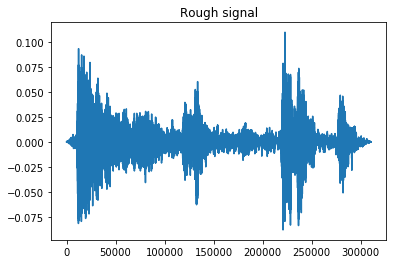

In [85]:
wav_file = 'data/train_curated/0006ae4e.wav'
# rate, signal = wavfile.read(wav_file)
signal, rate = librosa.load(wav_file, sr=None)
print(f'Rate of {rate} obs/sec')

plt.plot(signal)
plt.title('Rough signal')
plt.show()

In [86]:
ipd.Audio(wav_file)

# Basic Terminology

Def. **Amplitude**

Given a signal `s` over time we call **amplitude** the range of the signal. This is perfectly well defined as `s` is a series of real numbers.

$$
\text{Amplitude} = range(s) 
$$

Def. **Magnitude**

Given a signal `s` over time we call **magnitude** the range of the FFT(signal). This is the range of the signal representation in term of sinodal functions.

$$
\text{Magnitude} = range(FFT(s)) 
$$

Def. **Frequency**

Given a signal `s` over time we call **frequency** the ratio of the amount of times that the signal is repeated over a specific amount of time. The following relation holds:

$$
\text{Frequency} = \frac{1}{\text{Expected repetition time}}
$$

# Basic Processing


## Pre-Emphasis

Pre-emphasis filter is used to amplify the higher frequencies. Given a 1D signal $x: \mathbb{Z} \rightarrow \mathbb{R}$, it is defined with the following operator.

$$
y(t) = x(t) - \alpha x(t-1)
$$

Where $\alpha \in [0,1]$ is an hyper-parameter that can be thought as how strong is the pre-emphasis. The usual values are .95 or .97. 

In some scenarios it might be useful for the following reasons:

1. Balances the frequency spectrum since high frequencies have smaller magnitudes compared to lower frequencies.

2. Avoid numerical problems during FFT (some implementations).

3. May improve Signal-to-Noise Ratio (SNR).

**While it might be still useful, this technique has proven to have modest effect in modern systems/implementations.**

In [87]:
rate

44100

In [88]:
alpha = .97
emph_signal = np.append(signal[0], signal[1:] - alpha*signal[:-1])

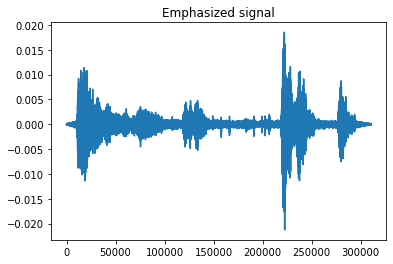

In [89]:
plt.plot(emph_signal)
plt.title('Emphasized signal')
plt.show()

In [90]:
ipd.Audio(emph_signal, rate=rate)

## Envelop

If after looking at the plots we observe lots of space with "death signal" it's important to remove them so the ML portion don't pay attention to them.

A usual practice to remove the parts of the domain where there is not enough signal is to compute the theoretical lower boundary the microphone can capture and then set to zero everything under that.

To do so we will be computing the "envelop" of the signal.

<img src="imgs/signal_evelop.jpg">

The envelop is the orange line. We want an estimation for the magnitude. If it falls too low we will just consider that it died. 

In [91]:
def envelop(y, rate, threshold=.0005):
    '''
    Computes the mask of valid/non-valid signals based on the envelop.
    
    to compute the evelop we don't want to check individual values that fall
    but when a consecutive values fall --> Rolling windows. 
    
    y: List[int], rate, threshold=.0005
    '''
    mask = []
    y = pd.Series(y).apply(np.abs)
    
    # if more periods are needed we get NaN in the extremess.
    y_mean = y.rolling(window=rate//10,center=True, min_periods=1).mean() 
    
    for mean in y_mean:
        if mean > threshold: mask.append(True)
        else: mask.append(False)
            
    return mask

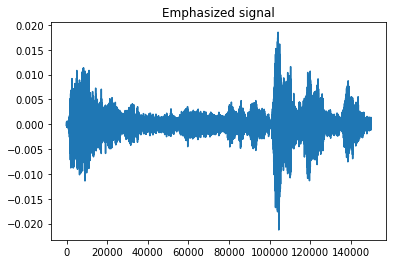

In [99]:
plt.plot(emph_signal[envelop(emph_signal, rate, threshold=0.0005)])
plt.title('Emphasized signal')
plt.show()

In [101]:
emph_signal.mean(),emph_signal.std(),emph_signal.min(), emph_signal.max()

(-1.721936e-06, 0.0013626369, -0.021264343, 0.018536987)

In [103]:
env_signal = emph_signal[envelop(emph_signal, rate, threshold=0.0005)]
ipd.Audio(env_signal, rate=rate)

## Framing

Framing refers to the process of splitting the signal into short-time frames. 

The reason behind framing is obtaining a better representation of the signal through a Fast Fourier Transformation(FFT). Because the frequency of a signal is likely to change over time it does not make sense to model the whole signal at once with one FFT. What we can do is split the signal into frames and do a FFT of each of them to obtain a more accurate approximation.

As a naive example imagine that we frame our previous sample every `N=11.000` observations or, equivalently, `N/rate = 11_000/44100 = 0.249 sec = 249 ms`.

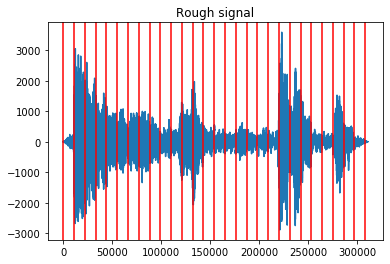

In [12]:
N = 11_000

plt.plot(signal)
plt.title('Rough signal')

x = 0 
L = len(signal)
while x < L:
    plt.axvline(x=x, color='red')
    x += N

plt.show()

However life is not always that easy and more complex framings have proven to perform better. 

**In speech processing** framing usually ranges from `20ms` to `40ms` with `50% (+/-10%)` overlap btw consecutive frames.

Popular set-up:

* Frame size: 25ms (`frame_size=0.025`)
* Frame stride: 10ms (`frame_stride=0.01`)

Which imply a 15 ms overlap.

In [26]:
def make_frames(signal, rate, frame_length, frame_step):
    
    signal_length = len(signal)
    
    num = float(np.abs(signal_length - frame_length))
    n_frames = int(np.ceil(num/frame_step))
    
    pad_signal_length = n_frames*frame_step + frame_length
    
    # Extend original signal with 0-padding
    z = np.zeros(pad_signal_length-signal_length)
    pad_signal = np.append(signal, z)
    
    
    A = np.tile(np.arange(0,frame_length), (n_frames, 1)) # rows: [0,1,2,...,frame_length-1]
    B = np.tile(np.arange(0, n_frames * frame_step, frame_step), (frame_length,1)) # rows: [0, frame_step, 2*frame_step, ..., (num_frames-1)*frame_step]
    indices = A + B.T
    
    return pad_signal[indices.astype(np.int32,copy=False)]

In [29]:
frame_size=.025
frame_stride=.01

frame_length = int(round(rate * frame_size))
frame_step = int(round(rate * frame_stride))

frames = make_frames(signal, rate, frame_length, frame_step)

In [30]:
frames[:10,:10]

array([[  0.,   0.,   0.,   2.,   4.,   4.,   4.,   1.,  -1.,   1.],
       [ -5.,  -4.,  -5.,  -7.,  -6.,  -7.,  -7.,  -8., -10.,  -8.],
       [ -6.,  -5.,  -6.,  -5.,  -5.,  -6.,  -6.,  -4.,  -4.,  -4.],
       [ -5.,  -7.,  -9., -10.,  -8.,  -9., -10.,  -9.,  -7.,  -3.],
       [ 18.,  19.,  20.,  18.,  17.,  16.,  13.,  13.,  15.,  17.],
       [-18., -18., -16., -15., -12., -13., -17., -17., -12.,  -6.],
       [ -3.,  -2.,  -1.,  -2.,   1.,   5.,   9.,  10.,   8.,  10.],
       [  0.,   2.,   0.,   0.,  -1.,  -2.,  -1.,   0.,   2.,  -2.],
       [ -2.,   1.,  -1.,   3.,   6.,  11.,  13.,  14.,  14.,  18.],
       [-69., -65., -66., -65., -64., -59., -53., -54., -52., -47.]])

## Windowing

Windowing is different from framing. Windowing aims to decrease the spectral leakage introduced by the inconsistency of:

* Having a signal represented by a **finite number of points**.
* The **FFT assumption** that the signal is represented by an infinite number of points.

Windowing is done frame-wise. Following **Haytham Fayek** explanation we will use the **Hamming window**:

$$
w[n] = 0.54 - 0.46cos\left(\frac{2\pi n}{N-1}\right)
$$

where `N = #obs in a frame` and $0\leq n \leq N-1$.

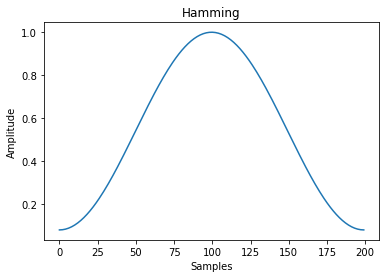

In [33]:
plt.plot(np.hamming(200))
plt.title('Hamming')
plt.ylabel('Amplitude');plt.xlabel('Samples')
plt.show()

In [22]:
np.hamming(5)

array([0.08, 0.54, 1.  , 0.54, 0.08])

And it's applied as a multiplicative factor to the frame.

In [31]:
frames *= np.hamming(frame_length) # This uses numpy's broadcast.

## Fourier-Transform and Power Spectrum

We can now do an $N$**-point FFT** in each frame (also called **Short-Time FFT** (STFFT)).

And then compute the power spectrum (periodogram) using:

$$
P = \frac{\left|FFT(x_i)\right|^2}{N}
$$

where $x_i$ is the $i^{th}$ frame of signal $x$.

The amount of points in a STFFT can be specified via *time* or *#points*. Remember that the `rate` is the amount of points we have in a second in that record/sample.

In terms of *# points* $N$ (`NFFT`) is typically set to $256$ or $512$ (in Automatic Speech Recognition).

In terms of time we may want to ask how short we want to make the intervals to be. For example, let's say we want to do $25ms$ intervals. Then:

$$
\frac{1}{0.025} = 40
$$

Then, the amount of points corresponding to $25ms$ is:

$$
N = \frac{rate}{40} = \frac{44100}{40} \approx 1103
$$

**Note:** If result is not integer take the ceiling for the # points.

In [36]:
NFFT = 512
mag_frames = np.absolute(np.fft.rfft(frames, NFFT))  # Magnitude of the FFT
pow_frames = ((1.0 / NFFT) * ((mag_frames) ** 2))

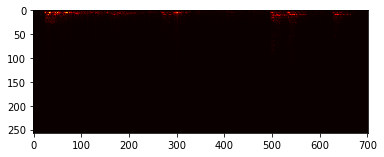

In [43]:
plt.imshow(mag_frames.T, cmap="hot", interpolation='nearest')

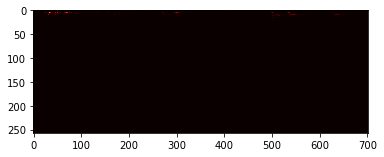

In [44]:
plt.imshow(pow_frames.T, cmap="hot", interpolation='nearest')

## Filter banks

Final steps on computing filter banks is applying **triangular filters**, typically $40$ (`nfilt=40`) **on a Mel-scale** to the power spectrum to extract frequency bands. 

### Step 1: Hertz to Mel scale

The **Mel-scale** aims to mimic the non-linear human ear perception of sound, by being **more discriminative at lower frequencies** and **less discriminative at higher frequencies**. 

The following converts from/to **Hertz** ( $\mathcal{f}$ ) to/from **Mel** ( $\mathcal{m}$ ).

$$
\mathcal{m} = 2595\log_10\left(1 + \frac{\mathcal{f}}{700}\right)\\
\mathcal{f} = 700(10^{\mathcal{m}/2595}-1)
$$

### Step 2: Triangular filters

Each filter in the filter bank is triangular.

They have a response of 1 in their respective centers and linearly decreases towards 0 till it reaches the center frequencies of two adjacent filters. 

<img src='imgs/mel_filters.jpg'>

In Python we can do that using the `logfbank` in the  `python_speech_features` package. Let's compute it for 1 sec of our audio (`signal[:rate]`).

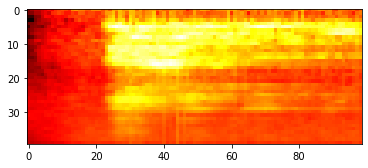

In [52]:
bank = logfbank(signal[:rate], rate, nfilt=40, nfft=1103).T
plt.imshow(bank, cmap='hot', interpolation='nearest')

## Mel-Frequency Cepstral Coefficients (MFCCs)

Turns out that filter bank coefficients computed in the previous step are highly correlated (problematic for some ML alg!). 

The Mel-frequency Cepstral Coefficients (MFCCs) are computed by applying a *Discrete Cosine Transformation (DCT)* to the filter bank coefficients.

In Automatic Speech Recognition (ASR), the resulting coefficients 2-13 are retained & the rest discarded; `num_ceps = 13`. 

The discarded coefficients represent fast changes in the filter bank coefficients & these fine details don't contribute to ASR.

Just as before we can use the `python_speech_features`.

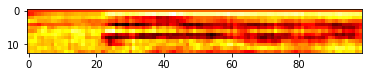

In [104]:
mel = mfcc(signal[:rate], rate, numcep=13, nfilt=26, nfft=1103).T

plt.imshow(mel, cmap='hot', interpolation='nearest')

## Mean Normalization

To balance the spectrum and **improve the Signal-to-Noise Ratio** (SNR), we can substract the mean of each coefficient from all frames. 

### Filter Banks

In [59]:
bank.mean(axis=0).shape # mean of coeff across frame 

(99,)

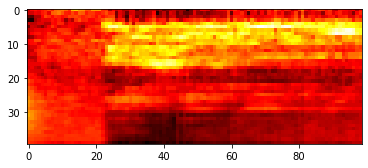

In [60]:
bank -= np.mean(bank, axis=0)
plt.imshow(bank, cmap='hot', interpolation='nearest')

### Mel-Frequency Cepstral Coefficients

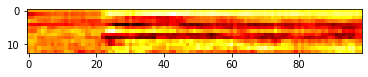

In [61]:
mel -= np.mean(mel, axis=0)
plt.imshow(mel, cmap='hot', interpolation='nearest')

# Data Augmentation

##  Noise Injection

Noise injection is basically adding random noise into the wave. While useful it is important to keep in mind the magnitude of your waves and choose the `noise_factor` wisely to preserve the signal while simulating possible cases you may face at evaluation time.

In [105]:
def noise_injection(signal, noise_factor:float):
    epsilon = np.random.rand(signal.shape[0])
    return signal + epsilon*noise_factor

noisy_signal = noise_injection(signal, 1e-2)

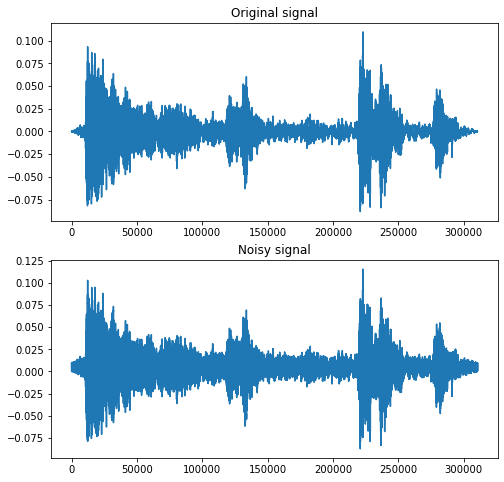

In [110]:

plt.figure(figsize=(8,8))
plt.subplot(211)
plt.plot(signal)
plt.title('Original signal')
plt.subplot(212)
plt.plot(noisy_signal)
plt.title('Noisy signal')
plt.show()

## Shifting Time

The idea of this approach is basically shifting the original wave to left/right a random number of seconds. If we shift right the signal will be moving to the right hand-side and the first seconds will be set to $0$ (silent). If we shift left the signal will be moving to the left hand-side and the last seconds will be set to $0$ (silent).

While in general that might be a good approach if we take samples of an audio for training we intrinsically perform a shifting + cutting approach.

In [114]:
def shift_signal(signal:np.ndarray, max_ptg:float, rigth:bool):
    
    ptg = np.random.uniform(high=max_ptg)
    shift = int(len(signal)*ptg)
    
    shifted_signal = np.zeros(len(signal))
    
    if rigth: shifted_signal[shift:] = signal[:-shift]
    else: shifted_signal[:-shift] = signal[shift:]
    
    return shifted_signal

r_shft_signal = shift_signal(signal, .1, True)
l_shft_signal = shift_signal(signal, .1, False)

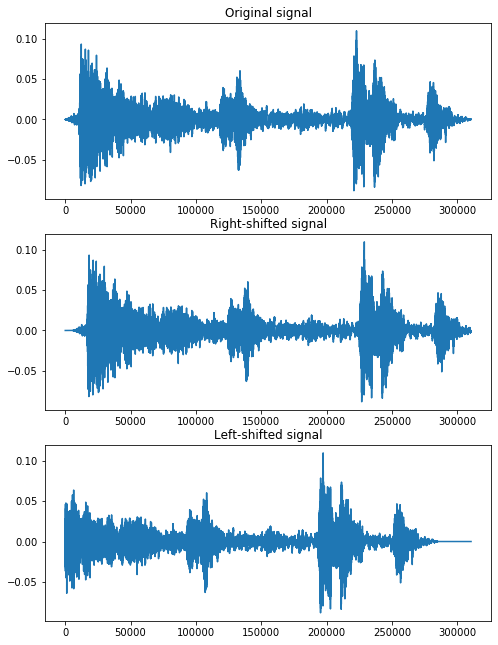

In [119]:
plt.figure(figsize=(8,11))
plt.subplot(311)
plt.plot(signal)
plt.title('Original signal')
plt.subplot(312)
plt.plot(r_shft_signal)
plt.title('Right-shifted signal')
plt.subplot(313)
plt.plot(l_shft_signal)
plt.title('Left-shifted signal')
plt.show()

## Changing Pitch

Random change of the pitch by using a `librosa` with a random `pitch_factor` up to a limit.

In [ ]:
# ?? librosa.effects.pitch_shift

In [155]:
def pitch_alteration(signal, rate, pitch_factor):
    return librosa.effects.pitch_shift(signal, rate, pitch_factor)

p_alt_signal = pitch_alteration(signal, rate, pitch_factor=15) # similar to a chiuaua 
to_much_p_alt_signal = pitch_alteration(signal, rate, pitch_factor=30) # not real

In [134]:
ipd.Audio(signal, rate=rate)

In [156]:
ipd.Audio(p_alt_signal, rate=rate)

In [136]:
ipd.Audio(to_much_p_alt_signal, rate=rate)

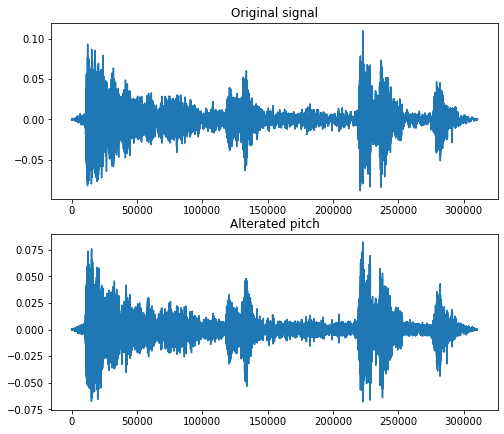

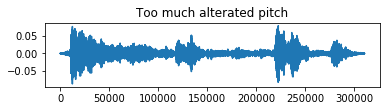

In [138]:
plt.figure(figsize=(8,11))
plt.subplot(311)
plt.plot(signal)
plt.title('Original signal')
plt.subplot(312)
plt.plot(p_alt_signal)
plt.title('Alterated pitch')
plt.show()
plt.subplot(313)
plt.plot(to_much_p_alt_signal)
plt.title('Too much alterated pitch')
plt.show()

## Changing Speed

Random change of the pitch by using a `librosa` with a random `speed_factor` up to a limit.

In [152]:
# ?? librosa.effects.time_stretch

In [151]:
def speed_alteration(signal, speed_factor):
    return librosa.effects.time_stretch(signal, speed_factor)

speeded_signal = speed_alteration(signal, speed_factor=2)
slowered_signal = speed_alteration(signal, speed_factor=.1)

In [150]:
# Original version
ipd.Audio(signal, rate=rate)

In [148]:
# Twice speed version
ipd.Audio(speeded_signal, rate=rate)

In [149]:
# Ten times slower version
ipd.Audio(slowered_signal, rate=rate)

## Other effects 

The `librosa.effects` module also offers other options.

In [158]:
# ?? librosa.effects